# Downscaling with Static Method

To use the downscaling method, it is required to have *GRASS GIS* installed. *Kalpana* uses *GRASS GIS* in the backend calling it from a python script. On a Linux OS, you just need to install/compile *GRASS GIS* (https://grass.osgeo.org/) and create a [conda environment](https://conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html) using the yml file provided in the *install* folder. On Windows it is more complicated. You need to install *GRASS GIS* and use the *Python* installation that comes with *GRASS GIS*. We will provide a short tutorial soon. To make it more user-friendly we made two *Docker* images to run the *Kalpana* downscaling tools. One of the images if for running the container interactively, and the other is non interactive. The instructions for using them in the readme file.

This notebook includes the code shows an example of the output of the Downscaling examples 01 and 02 (the plots were not produced with this notebook).

In [10]:
from IPython.display import display, Image

#### Example 01

In [ ]:
## first step is to add the github repo to the path, so functions can be imported.
#import sys
#sys.path.append(r'/rsstu/users/j/jcdietri/DHS-CRCoE-2016-2020/tacuevas/github/Kalpana')
## in this case is not necessary since the module is in the same folder
import os
from kalpana.downscaling import meshRepLen2raster

'''
This script creates a grass location importing the DEM for downscaling and also creates
a new DEM with same resolution and extend with the size of the mesh triangles. This step
is key for the downscaling and can be run in advance, since only depends on the mesh.
'''

fort14 = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Docker/downscaling/north_carolina/inputs/fort.14' ## path of the fort.14 file
epsgIn = 4326 ## CRS for lat/lon
epsgOut = 6543 ## projected CRS for NC
pathOut = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Examples_github/example01/NC9.shp' ## full path of the output shapefile 
grassVer = 8.2
pathRasFiles = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Docker/downscaling/north_carolina/inputs'
rasterFiles = 'ncDEMs_epsg6543'
## in this case we will use the same downscaling raster bounding box as the subdomain

meshRepLen2raster(fort14, epsgIn, epsgOut, pathOut, grassVer, pathRasFiles, rasterFiles, 
                  subDomain=os.path.join(pathRasFiles, rasterFiles), nameGrassLocation=None, createGrassLocation=True, 
                  createLocMethod='from_raster')

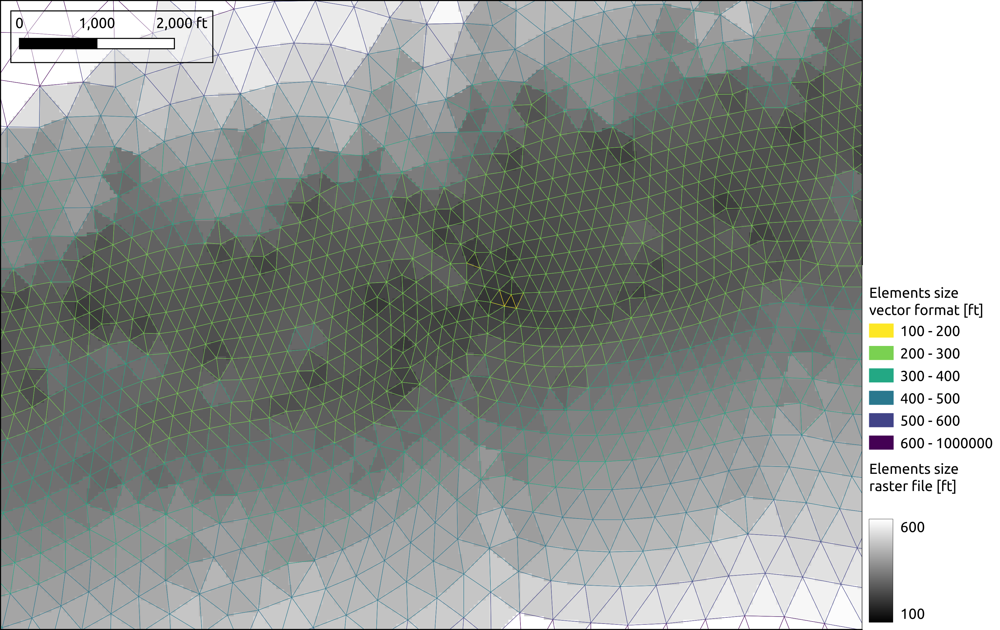

In [11]:
display(Image(filename='../adds/imgs/rep_len.png', width = 712))

ADCIRC mesh in vector format over raster with the elements representative size. Each raster cell has a value of $\frac{1}{3}$ <br>
times the element's perimeter it lies in. All the cells inside one element have the same value. <br>

In this example, the background DEM has a constant resolution of 15 m. The color of the mesh shows the representative size of each element. <br>
E.g., all the DEM cells inside an element of size 100 m have a cell value of 100 m. The same applies to larger elements. <br>

This DEM is used in the next downscaling step.

#### Example 02

In [ ]:
#!/usr/bin/env python
# coding: utf-8

## add github repo to path
#import sys
#sys.path.append(r'/rsstu/users/j/jcdietri/DHS-CRCoE-2016-2020/tacuevas/github/Kalpana')
import os
from kalpana.downscaling import runStatic

'''
Example for doing the static downscaling using an existing grass location, and importing
the DEM with the mesh elements size. Both inputs were created in the example_01.
There is a short description of all inputs below, more detail can be found in the
docstring of the function in the github repository.
'''


## full path of the maxele file
ncFile = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Docker/inputs/maxele.63.nc'
## contour levels to use in the downscaling
## from 0 to 11 (included) every 1
levels = [0, 11, 1]
## output CRS
epsgOut = 6543
## full path for the shape file with the maxele contours
## same path is used for saving rasters and the grass location
pathOut = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Examples_github/example02/maxele_florence.shp'
## version of grass 8.2 and 8.3 works
grassVer = 8.2
## path of the downscaling rasters
pathRasFiles = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Docker/downscaling/north_carolina/inputs'
## rasters filenames, can be a list if more than one. 
## 'all' for importing ALL THE FILES in pathRasFiles 
rasterFiles = 'ncDEMs_epsg6543'
## full path of the raster with the mesh element size
meshFile = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Examples_github/example01/NC9.tif'
## crs of adcirc output (default value)
epsgIn = 4326
## vertical unit of the maxele
vUnitIn = 'm'
## vertical unit of the downscaled water levels
vUnitOut = 'ft'
## name of the maxele variable to downscale. Always 'zeta_max' for downscaling
var = 'zeta_max'
## contours type. Always 'polygon' for downscaling
conType = 'polygon'
## full path of file (kml, kmz, shp, gpkg or tif) to crop the domain.
## in this case we will use the same downscaling raster bounding box as the subdomain
subDomain = os.path.join(pathRasFiles, rasterFiles)
## epsg code or crs of the subDomain. In this case, as we are using the downscaling dem bounding box
## as the subdomain, the same epsg code must be specified.
epsgSumDom = 6543
## boolean for exporting the mesh as a shape file from maxele, not necessary in this
## case since mesh was exported as preprocess. In example_03 it is exported.
exportMesh = False
## full path of pickle file with vertical datum differences for all mesh nodes
## proprocess step
dzFile = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Docker/downscaling/north_carolina/inputs/NC9mesh_from_tss2navd88.pkl'
## threshold to do apply the vertical datum difference, below -20 vyperdatum gives weird
## results
zeroDif = -20
## full path of the grass location if a existing one will be used
## if None a new location called 'grassLoc' is created. A new location is created in
## example_03
nameGrassLocation = r'/mnt/drive1/GoogleDrive/NCSU/NCSU/Kalpana/Examples_github/example01/grassLoc'
## Boolean for creating grass location, in this example it was created as a preprocess
## step. In example_03 it is created.
createGrassLocation = False
## Method for assigning the crs to the grass location. Default and faster option
createLocMethod = 'from_raster'
## variable to downscale, can be 'zMax', 'zMean' and 'zMin'. With 'zMean', the mean value
## of each contour is used.
attrCol = 'zMean'
## how many times the representative length the results are grown in the downscaling
repLenGrowing = 1.0 
## remove wet cells with water level below the ground surface
compAdcirc2dem = True
## transform the water level to water depth
floodDepth = False
## define clumpling threshold from mesh
clumpThreshold = 'from_mesh'
## percentage of the minimum element area to scale the clumping threshold
perMinElemArea = 1
## export downscaled results as shape files. Slows down the process a couple of minutes
ras2vec = False
## boolean for exporing raw maxele as a DEM. Useful for debugging
exportOrg = False
## boolean for reprojecting the downscaled dem back to lat/lon
finalOutToLatLon = True

#################### calling downscaling
runStatic(ncFile, levels, epsgOut, pathOut,  grassVer, pathRasFiles, rasterFiles, meshFile,
          epsgIn, vUnitIn, vUnitOut, var, conType, subDomain, epsgSumDom, exportMesh, dzFile, 
          zeroDif, nameGrassLocation, createGrassLocation, createLocMethod, attrCol, repLenGrowing, 
          compAdcirc2dem, floodDepth, clumpThreshold, perMinElemArea, ras2vec, exportOrg,
          finalOutToLatLon)

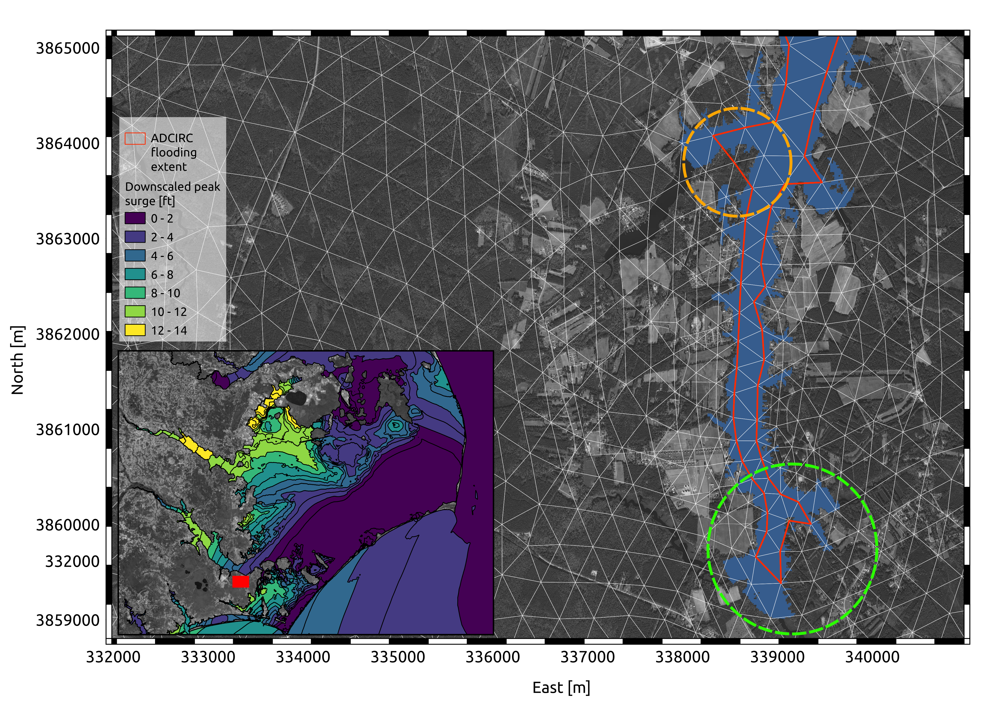

In [13]:
display(Image(filename='../adds/imgs/downscaling_example_utm18N_r2.png', width = 1024))

Final result of the downscaling process with Kalpana's Static Method. The smaller panel shows the raw peak surge for the North Carolina Coast. <br>
The main panel shows a close-up view of the Neuse River in the Outer Banks to appreciate the downscaling effect. <br>
The red line delineates the boundary of the raw ADCIRC peak surge. The green circle highlights an area where the peak surge is spatially expanded.<br>
The orange circle points to a dry area inside the raw ADCIRC peak surge boundary.